In [1]:
# Importing libraries
import numpy as np
import pandas as pd
import itertools
from scipy.special import comb
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
import plotly
import plotly.express as px
import matplotlib.pyplot as plt

# Reading and displaying Offset data
df = pd.read_csv('offset.dat', delimiter="\t")
df = df.rename(columns={'Tr-Ta': 'Tr_Ta'})
fig = px.scatter_3d(df[ df['rH'] == 5 ], x='Ta', y='Tr_Ta', z='va',
                    color='Offset')
plotly.offline.plot(fig, filename='2a.html')
fig.show()

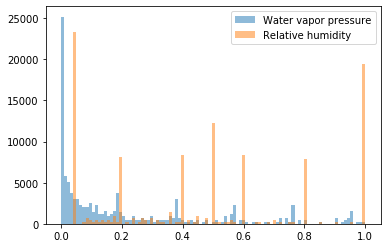

In [2]:
# The distribution of water vapor pressure and relative humidity
bins = np.linspace(0, 1, 100)
plt.hist(df['pa']/df['pa'].max(), bins, alpha=0.5, label='Water vapor pressure')
plt.hist(df['rH']/df['rH'].max(), bins, alpha=0.5, label='Relative humidity')
plt.legend(loc='upper right')
plt.savefig('2b.pdf')
plt.show()

In [3]:
# 3D plot of errors between the standard approximation and the data
from utci_standard_approx import *
df['utci_poly'] = df.apply(lambda x: utci_poly(x.Ta, x.Tr_Ta, x.va, x.rH), axis=1)
df['UTCI error'] = df['utci_poly']-df['Offset']
fig = px.scatter_3d(df[ df['rH'] == 5 ], x='Ta', y='Tr_Ta', z='va',
                    color='UTCI error')
plotly.offline.plot(fig, filename='3a.html')
fig.show()

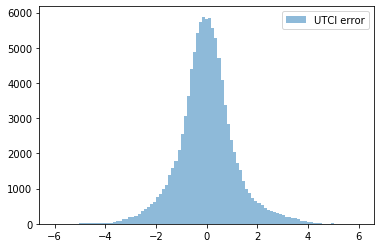

In [4]:
# Histogram of error distribution between the standard approximation and the data
bins = np.linspace(-6, 6, 100)
plt.hist(df['UTCI error'], bins, alpha=0.5, label='UTCI error')
plt.legend(loc='upper right')
plt.savefig('3b.pdf')
plt.show()

In [5]:
# Defining a numpy array of the data, excluding the water vapor pressure
nf = df.drop(columns=['pa'])
nf = nf.drop_duplicates()
ms = (nf.max()+nf.min())/2
md = (nf.max()-nf.min())/2
nf = (nf-ms)/md
nf = nf.to_numpy()

# The maxim degree of the polynomial approximation and the number of features
max_degree = 16
num_fts = 4
ranges = [range(max_degree+1) for _ in range(num_fts)]

# Generating the indices for the polynomial basis
indexdict = {i:[] for i in range(num_fts*max_degree+1)}
for indices in itertools.product(*ranges):
    indexdict[sum(indices)].append(indices)

for key in indexdict:
    indexdict[key] = set(indexdict[key])
    indexdict[key] = sorted(list(indexdict[key]), reverse=True)

indexlist = []
for key, value in indexdict.items() :
    indexlist += value
    
max_index = int(comb(max_degree + num_fts, num_fts))
indexpoly = indexlist[:max_index]

# Determining the basis in terms of Legendre polynomials
basis = np.zeros((len(nf), max_index))
s = 0
p0 = 1e-2
for (i, j, k, l) in indexpoly:
    p = s/max_index
    if (p >= p0 + 1e-2):
        print(np.ceil(1e2*p),'%', end='\r')
        p0 = p
    basis[:, s] = np.polynomial.legendre.legval(nf[:, 0], np.eye(1, i+1, i)[0])*\
                  np.polynomial.legendre.legval(nf[:, 1], np.eye(1, j+1, j)[0])*\
                  np.polynomial.legendre.legval(nf[:, 2], np.eye(1, k+1, k)[0])*\
                  np.polynomial.legendre.legval(nf[:, 3], np.eye(1, l+1, l)[0])
    s += 1

In [6]:
# Setting the training and test set indices
N = len(nf)
data_index = np.array(range(N))
np.random.shuffle(data_index)
train_index = data_index[:int(N/5)]
test_index = data_index[int(N/5):]

# Results for simple polynomial regression (in Table 1)
results_reg = {i:[] for i in range(4, 17, 2)}
print('Degree', ' ', 'No. parameters', ' ', 'Train loss', ' ', 'Test loss')
for degree in range(4, 17, 2):
    num_t = int(comb(degree + num_fts, num_fts))
    reg_fit = LinearRegression().fit(basis[train_index, : num_t], nf[train_index, 4])
    train_reg = reg_fit.predict(basis[train_index, : num_t])
    test_reg = reg_fit.predict(basis[test_index, : num_t])
    train_loss = np.sqrt(np.mean((nf[train_index, 4]-train_reg)**2))*md['Offset']
    test_loss = np.sqrt(np.mean((nf[test_index, 4]-test_reg)**2))*md['Offset']
    print(degree, '          ', len(np.where(reg_fit.coef_ != 0)[0]), '         ',
          "{:.2e}".format(train_loss), '    ', "{:.2e}".format(test_loss))
    results_reg[degree].append([reg_fit.coef_, train_loss, test_loss])

Degree   No. parameters   Train loss   Test loss
4            70           2.07e+00      2.11e+00
6            210           1.29e+00      1.31e+00
8            495           8.90e-01      9.22e-01
10            1001           6.57e-01      7.17e-01
12            1820           5.29e-01      6.08e-01
14            3060           4.34e-01      5.65e-01
16            4845           3.55e-01      1.38e+00


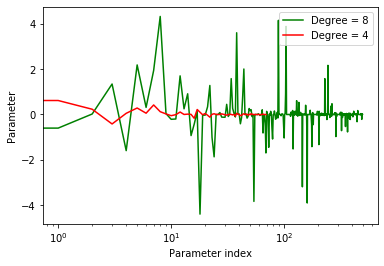

In [8]:
# Comparison of simple regression coefficients for degrees 6th and 8th
fig = plt.figure()
ax = plt.gca()
ax.plot(np.array(range(int(comb(8+num_fts, num_fts)))), results_reg[8][0][0], c='g', label='Degree = 8')
ax.plot(np.array(range(int(comb(4+num_fts, num_fts)))), results_reg[4][0][0], c='r', label='Degree = 4')
#ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel('Parameter index')
ax.set_ylabel('Parameter')
ax.legend(loc='upper right')
plt.savefig('5a.pdf')

In [9]:
from warnings import filterwarnings
filterwarnings('ignore')

# Results for sparse polynomial regression with orthogonal polynomials (in Table 1)
print('Degree', ' ', 'Alpha', ' ','No. parameters', ' ', 'Train loss', ' ', 'Test loss')
results_lasso = {i:[] for i in range(4, 17, 2)}
for degree in range(4, 17, 2):
    num_t = int(comb(degree + num_fts, num_fts))
    for a in np.linspace(3.1e-5, 3.1e-4, 15)[[0, 2, 5, 9, 14]]:
        lasso = Lasso(alpha = a)
        lasso_fit = lasso.fit(basis[train_index, : num_t], nf[train_index, 4])
        train_lasso = lasso_fit.predict(basis[train_index, : num_t])
        test_lasso = lasso_fit.predict(basis[test_index, : num_t])
        train_loss = np.sqrt(np.mean((nf[train_index, 4]-train_lasso)**2))*md['Offset']
        test_loss = np.sqrt(np.mean((nf[test_index, 4]-test_lasso)**2))*md['Offset']
        print(degree, '     ', "{:.1e}".format(a),'      ', len(np.where(lasso_fit.coef_ != 0)[0]), '       ',
          "{:.2e}".format(train_loss), '   ', "{:.2e}".format(test_loss), end='\n') 
        results_lasso[degree].append([lasso_fit.coef_, train_loss, test_loss])
    print()

Degree   Alpha   No. parameters   Train loss   Test loss
4       3.1e-05        66         2.07e+00     2.11e+00
4       7.1e-05        58         2.07e+00     2.11e+00
4       1.3e-04        55         2.08e+00     2.11e+00
4       2.1e-04        50         2.09e+00     2.13e+00
4       3.1e-04        45         2.12e+00     2.14e+00

6       3.1e-05        156         1.32e+00     1.35e+00
6       7.1e-05        118         1.36e+00     1.38e+00
6       1.3e-04        104         1.41e+00     1.42e+00
6       2.1e-04        91         1.47e+00     1.48e+00
6       3.1e-04        77         1.54e+00     1.55e+00

8       3.1e-05        243         9.75e-01     9.86e-01
8       7.1e-05        169         1.02e+00     1.03e+00
8       1.3e-04        137         1.09e+00     1.09e+00
8       2.1e-04        119         1.18e+00     1.19e+00
8       3.1e-04        99         1.31e+00     1.32e+00

10       3.1e-05        322         7.95e-01     8.07e-01
10       7.1e-05        218        

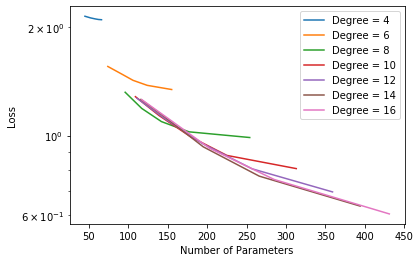

In [9]:
# Sparse regression losses for different degress and number of parameters
to_plot = {i:[] for i in range(4, 17, 2)}
for i in range(4, 17, 2):
    for j in range(5):
        to_plot[i].append([(results_lasso[i][j][0] != 0).sum(), results_lasso[i][j][2]])
for a in to_plot:
    to_plot[a] = np.array(to_plot[a])
fig = plt.figure()
ax = plt.gca()
for i in range(4, 17, 2):
    ax.plot(to_plot[i][:, 0], to_plot[i][:, 1], label = f'Degree = {i}')
#ax.scatter([210], [np.sqrt(np.mean(df['UTCI error']**2))], label = 'Standard')
ax.set_yscale('log')
ax.set_xlabel('Number of Parameters')
ax.set_ylabel('Loss')
ax.legend(loc='upper right')
plt.savefig('4.pdf')

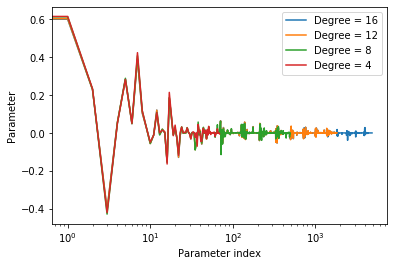

In [10]:
# The parameters (or coefficients) for different degree polynomials
fig = plt.figure()
ax = plt.gca()
for i in reversed(range(4, 17, 4)):
    ax.plot(np.array(range(int(comb(i+num_fts, num_fts)))), results_lasso[i][0][0], label = f'Degree = {i}')
#ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel('Parameter index')
ax.set_ylabel('Parameter')
ax.legend(loc='upper right')
plt.savefig('5b.pdf')

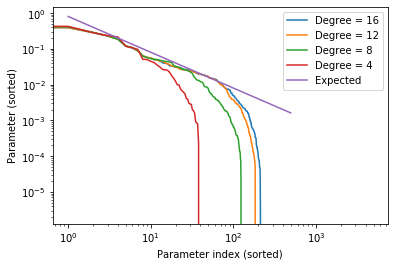

In [11]:
# The scaling of parameters with their index
fig = plt.figure()
ax = plt.gca()
for i in reversed(range(4, 17, 4)):
    ax.plot(np.array(range(int(comb(i+num_fts, num_fts)))), sorted(results_lasso[i][0][0], reverse=True), label = f'Degree = {i}')
xdom = np.array(range(1, int(comb(8+num_fts, num_fts))))
ax.plot(xdom, 0.8/xdom, label='Expected')
ax.set_xlabel('Parameter index (sorted)')
ax.set_ylabel('Parameter (sorted)')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(loc='upper right')
plt.savefig('6a.pdf')

In [10]:
# The spatial distribution of errors between the sparse regression fit and the real values for relative humidity of 5%
num_t = int(comb(10 + num_fts, num_fts))
a = np.linspace(3.1e-5, 3.1e-4, 15)[2]
lasso = Lasso(alpha = a)
lasso_fit = lasso.fit(basis[train_index, : num_t], nf[train_index, 4])

df['fit'] = lasso_fit.predict(basis[:, :num_t])*md['Offset'] + ms['Offset']
df['Fit error'] = df['fit']-df['Offset']

fig = px.scatter_3d(df[ df['rH'] == 5 ], x='Ta', y='Tr_Ta', z='va',
                    color='Fit error')
plotly.offline.plot(fig, filename='6b.html')
fig.show()

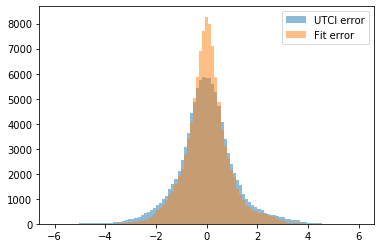

In [19]:
# Histograms of errors for the standard UTCI model and our fit 
plt.hist(df['UTCI error'] , bins, alpha=0.5, label='UTCI error')
plt.hist(df['Fit error'], bins, alpha=0.5, label='Fit error')
plt.legend(loc='upper right')
plt.savefig('7a.pdf')
plt.show()

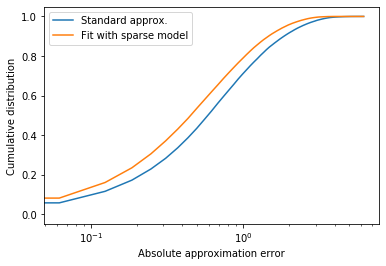

In [22]:
# Cumulative distribution of erros for the two models
standard_b = []
fit_b = []
upper_bound = np.linspace(0, np.abs(df['UTCI error']).max(), 101) 
for u in upper_bound:
    standard_b.append(len(np.where(np.abs(df['UTCI error']) < u)[0])/N)
    fit_b.append(len(np.where(np.abs(df['Fit error']) < u)[0])/N)

plt.ylabel("Cumulative distribution")
plt.xlabel("Absolute approximation error")
plt.plot(upper_bound, standard_b, label="Standard approx.")
plt.plot(upper_bound, fit_b, label="Fit with sparse model")
plt.xscale('log')
plt.legend(loc='bottom right')
plt.savefig('7b.pdf')